In [1]:
%matplotlib notebook
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import pandas as pd
import scipy as sp
from scipy.spatial import cKDTree
import pickle
from donutlib.decamutil import decaminfo
from scriptUtil import decodeNumberList


In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

In [3]:
# concatenate all individual DataFrames into one
#imageList = decodeNumberList("284601:284698")
#frames = []
#for anImage in imageList:
#    fileName = "Meshesv22/Science-20140212s2-v22i2_%d.pkl" % (anImage)
#    frames.append(pd.read_pickle(fileName))
#    
#allFrames = pd.concat(frames)
#allFrames.reset_index(inplace=True, drop=True) 
#allFrames.to_pickle("Meshesv22/Science-20140212s2-v22i2_All.pkl")
allFrames = pd.read_pickle("/u/ec/roodman/Astrophysics/Donuts/Meshesv22/Science-20140212s2-v22i2_All.pkl")

In [4]:
allFrames['ZERN4'][0:10]*(1500./8.7)-2023.657478

0     1.989051
1    -2.073090
2    10.195844
3    23.888455
4     2.098527
5     2.978855
6     6.791932
7    11.311446
8    -4.029454
9     1.618722
Name: ZERN4, dtype: float64

In [5]:
print(allFrames.shape)
colList = allFrames.columns
print(colList[0:39])
print(colList[40:79])
print(colList[80:119])
print(colList[120:142])

(632521, 142)
Index(['index', 'EXTEND', 'IFILE', 'FILTER', 'OBSID', 'OBSTYPE', 'ZD', 'HA',
       'EXPTIME', 'RA', 'DEC', 'MSURTEMP', 'MAIRTEMP', 'MJD-OBS', 'EXTNAME',
       'IX', 'IY', 'X_IMAGE', 'Y_IMAGE', 'ISTAMP', 'XDECAM', 'YDECAM',
       'SEX_FLUX', 'SEX_FLGS', 'SEX_ELPT', 'SEX_AVEI', 'CHI2', 'DOF',
       'FITSTAT', 'CLKTIME', 'NCALCALL', 'NCALCDER', 'NELE', 'RZERO', 'BKGD',
       'ZERN2', 'ZERN3', 'ZERN4', 'ZERN5'],
      dtype='object')
Index(['ZERN7', 'ZERN8', 'ZERN9', 'ZERN10', 'ZERN11', 'ZERN12', 'ZERN13',
       'ZERN14', 'ZERN15', 'ZERN16', 'ZERN17', 'ZERN18', 'ZERN19', 'ZERN20',
       'ZERN21', 'ZERN22', 'ZERN23', 'ZERN24', 'ZERN25', 'ZERN26', 'ZERN27',
       'ZERN28', 'ZERN29', 'ZERN30', 'ZERN31', 'ZERN32', 'ZERN33', 'ZERN34',
       'ZERN35', 'ZERN36', 'ZERN37', 'NELEE', 'RZEROE', 'BKGDE', 'ZERN2E',
       'ZERN3E', 'ZERN4E', 'ZERN5E', 'ZERN6E'],
      dtype='object')
Index(['ZERN8E', 'ZERN9E', 'ZERN10E', 'ZERN11E', 'ZERN12E', 'ZERN13E',
       'ZERN14E', 'ZERN15E

<IPython.core.display.Javascript object>


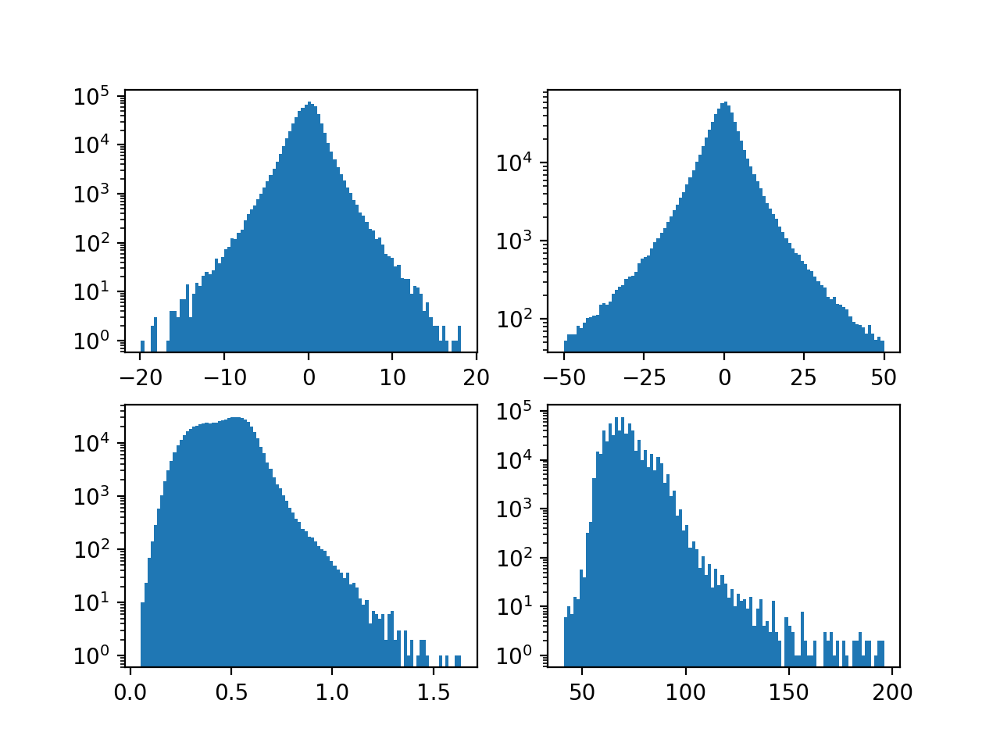

In [41]:
f,axa = plt.subplots(2,2)
ax = axa.flatten()
h = ax[0].hist(allFrames['nmad4'],bins=100)
ax[0].set_yscale('log')
h = ax[1].hist(allFrames['nmadNN4'],bins=100)
ax[1].set_yscale('log')
h = ax[2].hist(np.sqrt(np.power(allFrames.ZERN5,2)+np.power(allFrames.ZERN6,2)+np.power(allFrames.ZERN7,2)+np.power(allFrames.ZERN8,2)),bins=100)
ax[2].set_yscale('log')
h = ax[3].hist(allFrames['NCALCALL'].astype(float),bins=100)
ax[3].set_yscale('log')

In [7]:
# get data from ComboMeshesZemaxv22
#dfDataZv22 = pd.read_pickle("/u/ec/roodman/Astrophysics/Donuts/ComboMeshesZemaxv22/Science-20140212s2-v22i2_All.pickle")
dfAdjustZv22 = pd.read_pickle("/u/ec/roodman/Astrophysics/Donuts/ComboMeshesZemaxv22/Science-20140212s2-v22i2_All.pkl")
dfAdjustZI2v22 = pd.read_pickle("/u/ec/roodman/Astrophysics/Donuts/ComboMeshesZemaxIteration2v22/Science-20140212s2-v22i2_All.pkl")



In [8]:
cols = dfAdjustZv22.columns
print(cols[0:39])
print(dfAdjustZI2v22['z4delta'][0:10])

Index(['dodz', 'dodzerr', 'dodx', 'dody', 'doxt', 'doyt', 'dodxerr', 'dodyerr',
       'doxterr', 'doyterr', 'z4delta', 'z4thetax', 'z4thetay', 'z4deltaErr',
       'z4thetaxErr', 'z4thetayErr', 'z4meanDeltaBefore', 'z4rmsDeltaBefore',
       'z4meanDeltaAfter', 'z4rmsDeltaAfter', 'z5delta', 'z5thetax',
       'z5thetay', 'z5deltaErr', 'z5thetaxErr', 'z5thetayErr',
       'z5meanDeltaBefore', 'z5rmsDeltaBefore', 'z5meanDeltaAfter',
       'z5rmsDeltaAfter', 'z6delta', 'z6thetax', 'z6thetay', 'z6deltaErr',
       'z6thetaxErr', 'z6thetayErr', 'z6meanDeltaBefore', 'z6rmsDeltaBefore',
       'z6meanDeltaAfter'],
      dtype='object')
284601    2023.657478
284602    2017.639831
284603    2017.042149
284604    2009.303189
284605    2000.937587
284606    2006.725360
284607    2025.399280
284608    2003.420828
284609    2019.822219
284610    2026.653087
Name: z4delta, dtype: float64


In [9]:
# read in all the Combo meshes, combine into a single DF
def combineMeshFiles(meshDir,meshFileName):
    zList = [4,5,6,7,8,9,10,11,14,15]
    # build DataFrame
    dfAll = pd.DataFrame(columns=['Sensor','x','y'])
    for iZ in zList:
        fileName = "%s/z%dMesh_%s.dat" % (meshDir,iZ,meshFileName)    
        dataPoints = pd.read_csv(fileName, delim_whitespace=True,header=None,dtype={'Sensor': '|S', 'x': np.float64, 'y': np.float64,'z': np.float64, 'w': np.float64},names=['Sensor', 'x', 'y', 'z', 'w'])
        dfAll['Sensor'] = dataPoints['Sensor']
        dfAll['x'] = dataPoints['x']
        dfAll['y'] = dataPoints['y']
        dfAll['zern%d' % (iZ)] = dataPoints['z']
        dfAll['wzern%d' % (iZ)] = dataPoints['w']
    return dfAll
    

In [10]:
dfComboMeshesZemaxv22 = combineMeshFiles("/u/ec/roodman/Astrophysics/Donuts/ComboMeshesZemaxv22","Science-20140212s2-v22i2_All")

In [11]:
dfComboMeshesZemaxIteration2v22 = combineMeshFiles("/u/ec/roodman/Astrophysics/Donuts/ComboMeshesZemaxIteration2v22","Science-20140212s2-v22i2_All")

In [12]:
cols = dfComboMeshesZemaxv22.columns
print(cols[0:59])

Index(['Sensor', 'x', 'y', 'zern4', 'wzern4', 'zern5', 'wzern5', 'zern6',
       'wzern6', 'zern7', 'wzern7', 'zern8', 'wzern8', 'zern9', 'wzern9',
       'zern10', 'wzern10', 'zern11', 'wzern11', 'zern14', 'wzern14', 'zern15',
       'wzern15'],
      dtype='object')


In [13]:
# Flag used rows in allFrames, and add zernXX,wzernXX
xArr = allFrames['XDECAM'].values
yArr = allFrames['YDECAM'].values
z4delta_values = dfAdjustZI2v22.loc[allFrames['IFILE']]['z4delta'].values
allFrames['z4delta'] = z4delta_values
zArr = allFrames['ZERN4'].values*(1500./8.7)-allFrames['z4delta']
xyzArr = np.array([xArr,yArr,zArr])
xyztArr = xyzArr.transpose()
kdtree = cKDTree(xyztArr)
xyztArr.shape

(632521, 3)

In [14]:
xtry = dfComboMeshesZemaxIteration2v22['x']
ytry = dfComboMeshesZemaxIteration2v22['y']
ztry = dfComboMeshesZemaxIteration2v22['zern4']

xinput = np.array([xtry,ytry,ztry])
xtinput = xinput.transpose()
d,i = kdtree.query(xtinput,k=4)
print(d[0:10],i[0:10])

[[1.42404396e-06 9.11308217e-01 9.23508654e-01 1.12639363e+00]
 [3.56492499e-07 7.29311561e-01 7.93386040e-01 9.89226227e-01]
 [3.47866317e-06 8.88015077e-01 1.29860437e+00 1.36224025e+00]
 [6.65816834e-06 8.30434617e-01 1.07120099e+00 1.22589519e+00]
 [4.64920614e-06 4.37182919e-01 1.24517196e+00 1.24785188e+00]
 [1.93931110e-06 1.06189128e+00 1.26606571e+00 1.41554337e+00]
 [5.53013027e-06 6.24409060e-01 7.31938472e-01 9.66609900e-01]
 [1.61308204e-06 4.19040349e-01 6.21140590e-01 6.73164068e-01]
 [6.91978525e-07 9.88937959e-01 1.11095452e+00 1.30805891e+00]
 [6.13556459e-06 9.83506827e-01 2.00670691e+00 2.18204223e+00]] [[     0 571757 475342 349496]
 [     1 222831 316588 349498]
 [     2 434513 356151  94789]
 [     4 523322  82292 407508]
 [     5 427632 454953 156836]
 [     6 394418 150831  82297]
 [     8 475334 323206 509664]
 [    10 120046 356162 537222]
 [    11 578985 343009 228620]
 [    12 356167  51126 427643]]


In [15]:
f,ax = plt.subplots(1,4)
h = ax[0].hist(d[:,0],bins=100,range=[-.01,.01])
h = ax[1].hist(d[:,1],bins=100,range=[-.01,.01])
h = ax[2].hist(d[:,2],bins=100,range=[-.01,.01])
h = ax[3].hist(d[:,3],bins=100,range=[-.01,.01])
# unique matches!

<IPython.core.display.Javascript object>

In [16]:
def matchAndAdd(dfAll,dfAdjust,dfAdd,flagName='flag'):
    # build tree for dfAll
    xArr = dfAll['XDECAM'].values
    yArr = dfAll['YDECAM'].values
    z4delta_values = dfAdjust.loc[allFrames['IFILE']]['z4delta'].values
    dfAll['z4delta'] = z4delta_values
    zArr = dfAll['ZERN4'].values*(1500./8.7)-dfAll['z4delta']
    xyzArr = np.array([xArr,yArr,zArr])
    xyztArr = xyzArr.transpose()
    kdtree = cKDTree(xyztArr)
    
    # also add other needed delta,thetas from dfAdjust
    z5delta_values = dfAdjust.loc[allFrames['IFILE']]['z5delta'].values
    z5thetax_values = dfAdjust.loc[allFrames['IFILE']]['z5thetax'].values
    z5thetay_values = dfAdjust.loc[allFrames['IFILE']]['z5thetay'].values
    z6delta_values = dfAdjust.loc[allFrames['IFILE']]['z6delta'].values
    z6thetax_values = dfAdjust.loc[allFrames['IFILE']]['z6thetax'].values
    z6thetay_values = dfAdjust.loc[allFrames['IFILE']]['z6thetay'].values
    z7delta_values = dfAdjust.loc[allFrames['IFILE']]['z7delta'].values
    z8delta_values = dfAdjust.loc[allFrames['IFILE']]['z8delta'].values
    z9delta_values = dfAdjust.loc[allFrames['IFILE']]['z9delta'].values
    z10delta_values = dfAdjust.loc[allFrames['IFILE']]['z10delta'].values
    z11delta_values = dfAdjust.loc[allFrames['IFILE']]['z11delta'].values
    z14delta_values = dfAdjust.loc[allFrames['IFILE']]['z14delta'].values
    z15delta_values = dfAdjust.loc[allFrames['IFILE']]['z15delta'].values

    dfAll['z5delta'] = z5delta_values
    dfAll['z5thetax'] = z5thetax_values
    dfAll['z5thetay'] = z5thetay_values
    dfAll['z6delta'] = z6delta_values
    dfAll['z6thetax'] = z6thetax_values
    dfAll['z6thetay'] = z6thetay_values
    dfAll['z7delta'] = z7delta_values
    dfAll['z8delta'] = z8delta_values
    dfAll['z9delta'] = z9delta_values
    dfAll['z10delta'] = z10delta_values
    dfAll['z11delta'] = z11delta_values
    dfAll['z14delta'] = z14delta_values
    dfAll['z15delta'] = z15delta_values
    
    dfAll['z4corr'] = dfAll['ZERN4']*(1500./8.7)-dfAll['z4delta']
    dfAll['z5corr'] = dfAll['ZERN5']-(dfAll['z5delta']+dfAll['XDECAM']*dfAll['z5thetay']+dfAll['YDECAM']*dfAll['z5thetax'])
    dfAll['z6corr'] = dfAll['ZERN6']-(dfAll['z6delta']+dfAll['XDECAM']*dfAll['z6thetay']+dfAll['YDECAM']*dfAll['z6thetax'])
    dfAll['z7corr'] = dfAll['ZERN7']-dfAll['z7delta']
    dfAll['z8corr'] = dfAll['ZERN8']-dfAll['z8delta']
    dfAll['z9corr'] = dfAll['ZERN9']-dfAll['z9delta']
    dfAll['z10corr'] = dfAll['ZERN10']-dfAll['z10delta']
    dfAll['z11corr'] = dfAll['ZERN11']-dfAll['z11delta']
    dfAll['z14corr'] = dfAll['ZERN14']-dfAll['z14delta']
    dfAll['z15corr'] = dfAll['ZERN15']-dfAll['z15delta']

    
    # find matches from dfAdd
    xtry = dfAdd['x']
    ytry = dfAdd['y']
    ztry = dfAdd['zern4']

    xinput = np.array([xtry,ytry,ztry])
    xtinput = xinput.transpose()
    # matches are unique - just use 1st one 
    d,i = kdtree.query(xtinput,k=2)
    
    # add a flag to the dfAll
    dfAll[flagName] = False
    dfAll.loc[i[:,0],flagName] = True 

    return dfAll

In [17]:
allFramesP = matchAndAdd(allFrames,dfAdjustZI2v22,dfComboMeshesZemaxIteration2v22,flagName='flagZemax')

In [18]:
allFramesP.to_pickle("/u/ec/roodman/Astrophysics/Donuts/ComboMeshesZemaxIteration2v22/ComboMesh_Science-20140212s2-v22i2_All.pkl",protocol=2)

In [19]:
pd.options.display.max_columns = None
print(allFramesP)

        index EXTEND   IFILE                            FILTER  \
0        4011   True  284601  i DECam SDSS c0003 7835.0 1470.0   
1        4012   True  284601  i DECam SDSS c0003 7835.0 1470.0   
2        4013   True  284601  i DECam SDSS c0003 7835.0 1470.0   
3        4014   True  284601  i DECam SDSS c0003 7835.0 1470.0   
4        4015   True  284601  i DECam SDSS c0003 7835.0 1470.0   
5        4016   True  284601  i DECam SDSS c0003 7835.0 1470.0   
6        4017   True  284601  i DECam SDSS c0003 7835.0 1470.0   
7        4018   True  284601  i DECam SDSS c0003 7835.0 1470.0   
8        4019   True  284601  i DECam SDSS c0003 7835.0 1470.0   
9        4020   True  284601  i DECam SDSS c0003 7835.0 1470.0   
10       4021   True  284601  i DECam SDSS c0003 7835.0 1470.0   
11       4022   True  284601  i DECam SDSS c0003 7835.0 1470.0   
12       4023   True  284601  i DECam SDSS c0003 7835.0 1470.0   
13       4024   True  284601  i DECam SDSS c0003 7835.0 1470.0   
14       4

In [20]:
ok = allFramesP['flagZemax'] 
allFramesPC = allFramesP[ok]
notok = (allFramesP['flagZemax'] == False)
allFramesPCB = allFramesP[notok]



<IPython.core.display.Javascript object>


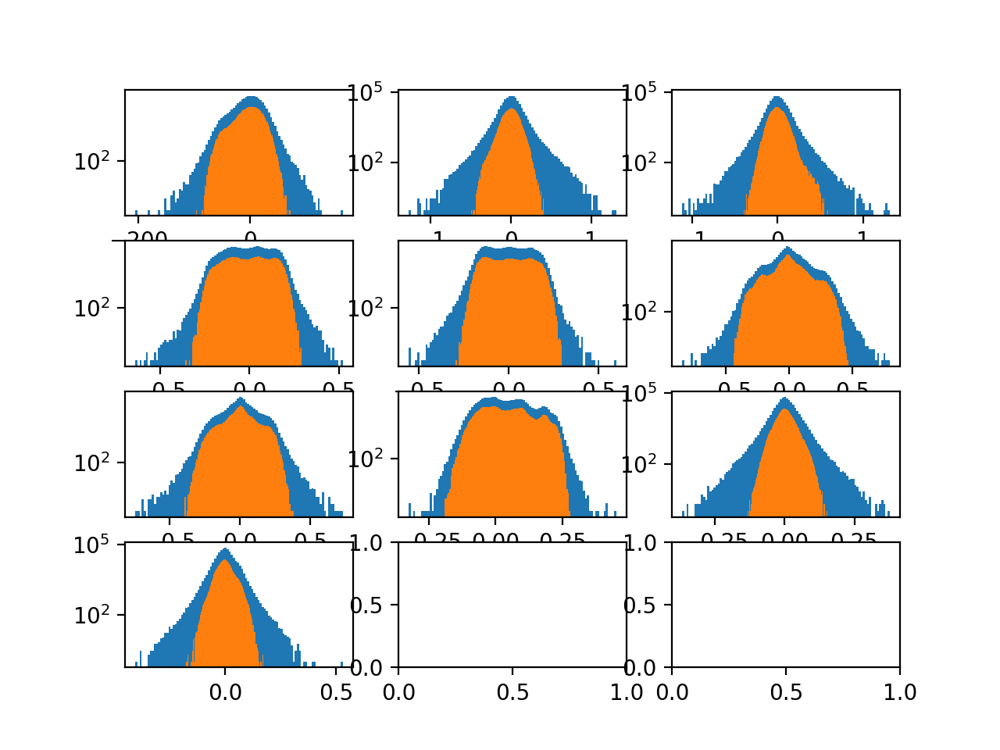

In [24]:
# plot ZERN4-z4delta w and w/o flag
f,ax = plt.subplots(4,3)
axf = ax.flatten()

zList = [4,5,6,7,8,9,10,11,14,15]
for i,iZ in enumerate(zList):
    
    zv = allFramesP['z%dcorr' % (iZ)].values
    h = axf[i].hist(zv,bins=100)
    zvc = allFramesPC['z%dcorr' % (iZ)].values
    h = axf[i].hist(zvc,bins=100)
    axf[i].set_yscale('log')

<IPython.core.display.Javascript object>


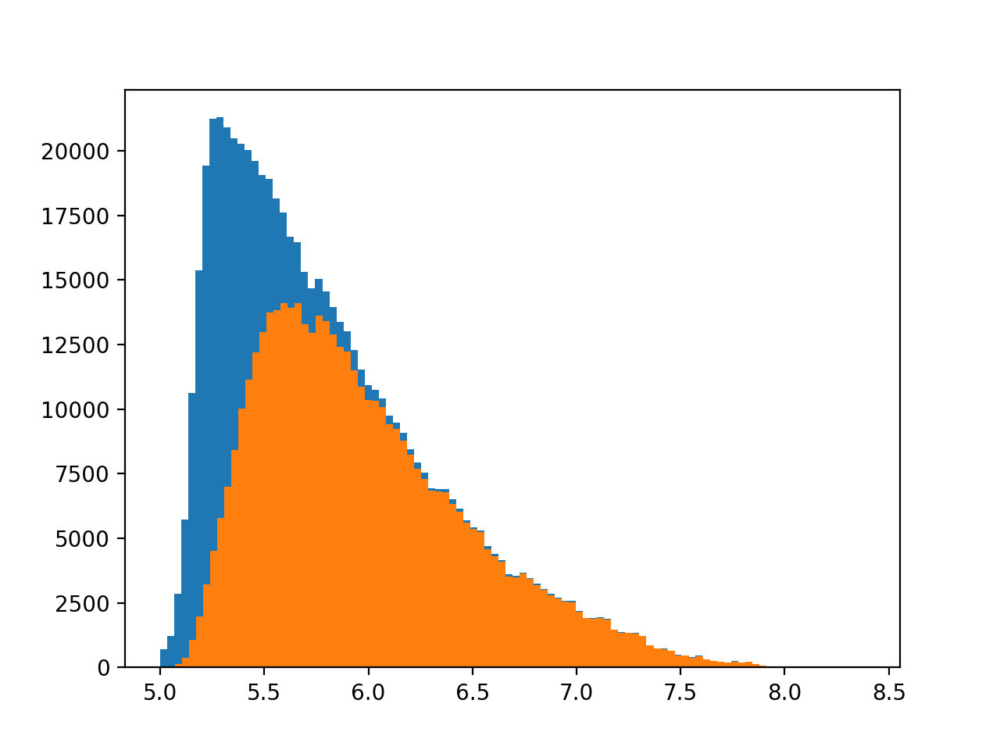

In [33]:
# plot Nele of used & unsed
f,ax = plt.subplots(1,1)

zv = np.log10(allFramesP['NELE'].values)
h = ax.hist(zv,bins=100)
zvc = np.log10(allFramesPC['NELE'].values)
h = ax.hist(zvc,bins=100)
#ax.set_yscale('log')

<IPython.core.display.Javascript object>


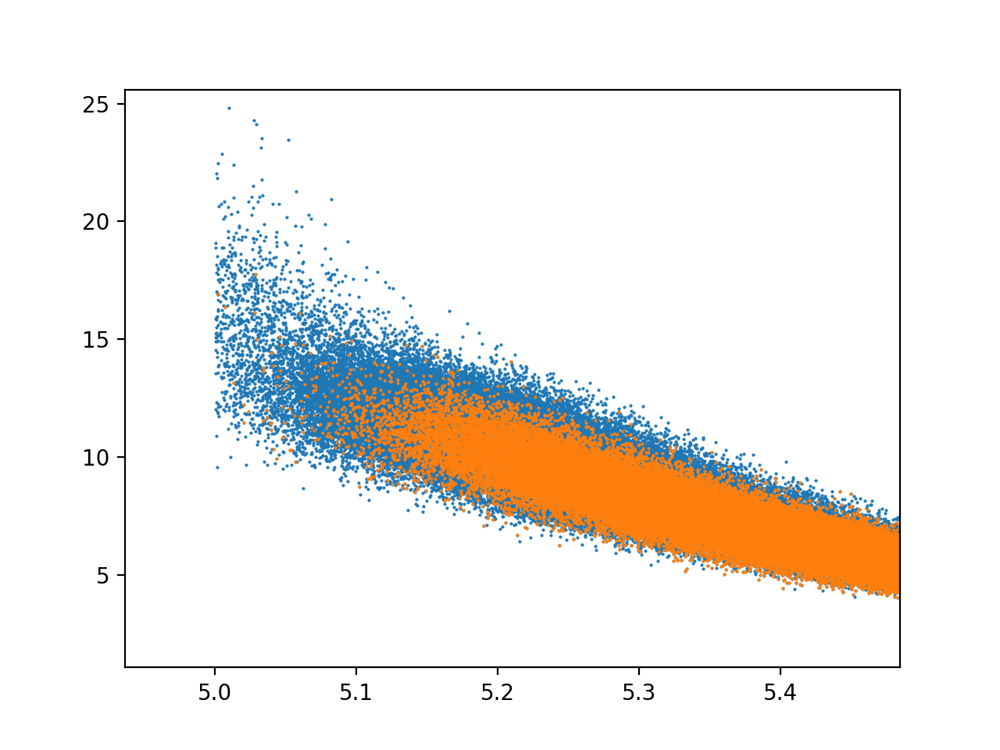

In [36]:
# plot Nele of used & unsed
f,ax = plt.subplots(1,1)

h = ax.scatter(np.log10(allFramesP['NELE']),allFramesP['ZERN4E']*1500./8.7,marker='.',s=1)
h = ax.scatter(np.log10(allFramesPC['NELE']),allFramesPC['ZERN4E']*1500./8.7,marker='.',s=1)


#ax.set_yscale('log')

<IPython.core.display.Javascript object>


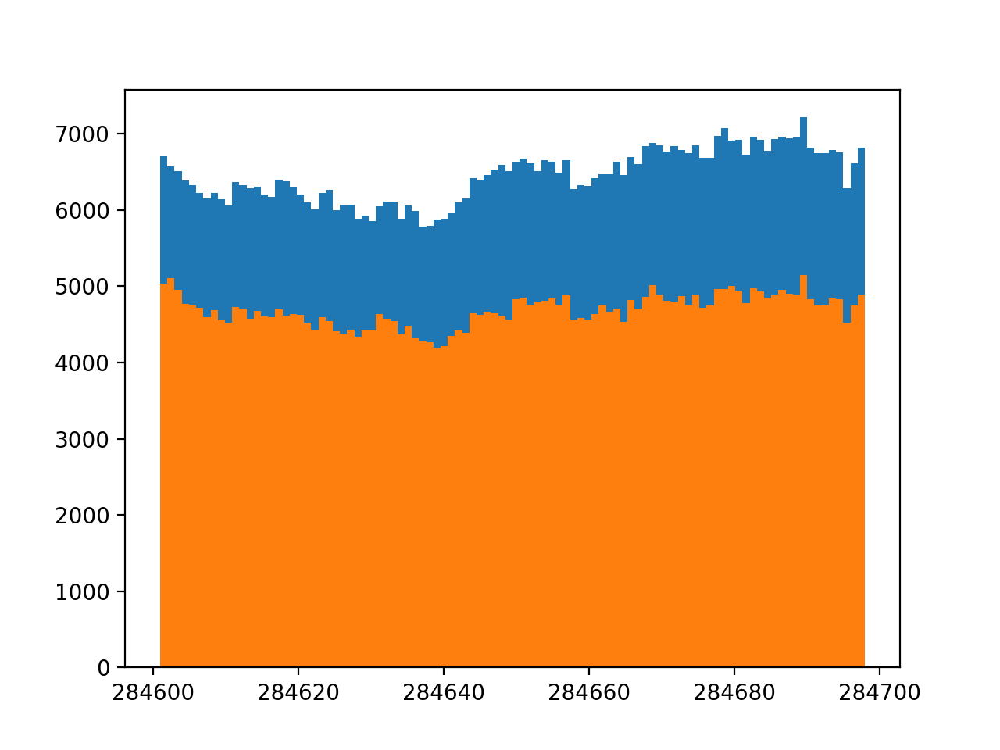

In [30]:
# plot Image # of used & unsed
f,ax = plt.subplots(1,1)

zv = allFramesP['IFILE'].astype(float).values
h = ax.hist(zv,bins=98)
zvc = allFramesPC['IFILE'].astype(float).values
h = ax.hist(zvc,bins=98)

# note that there about 7700 donuts found per image, so there another 1000 per image cut out by decamMesher's various cuts (fit quality, errors, MAD cuts)

<IPython.core.display.Javascript object>


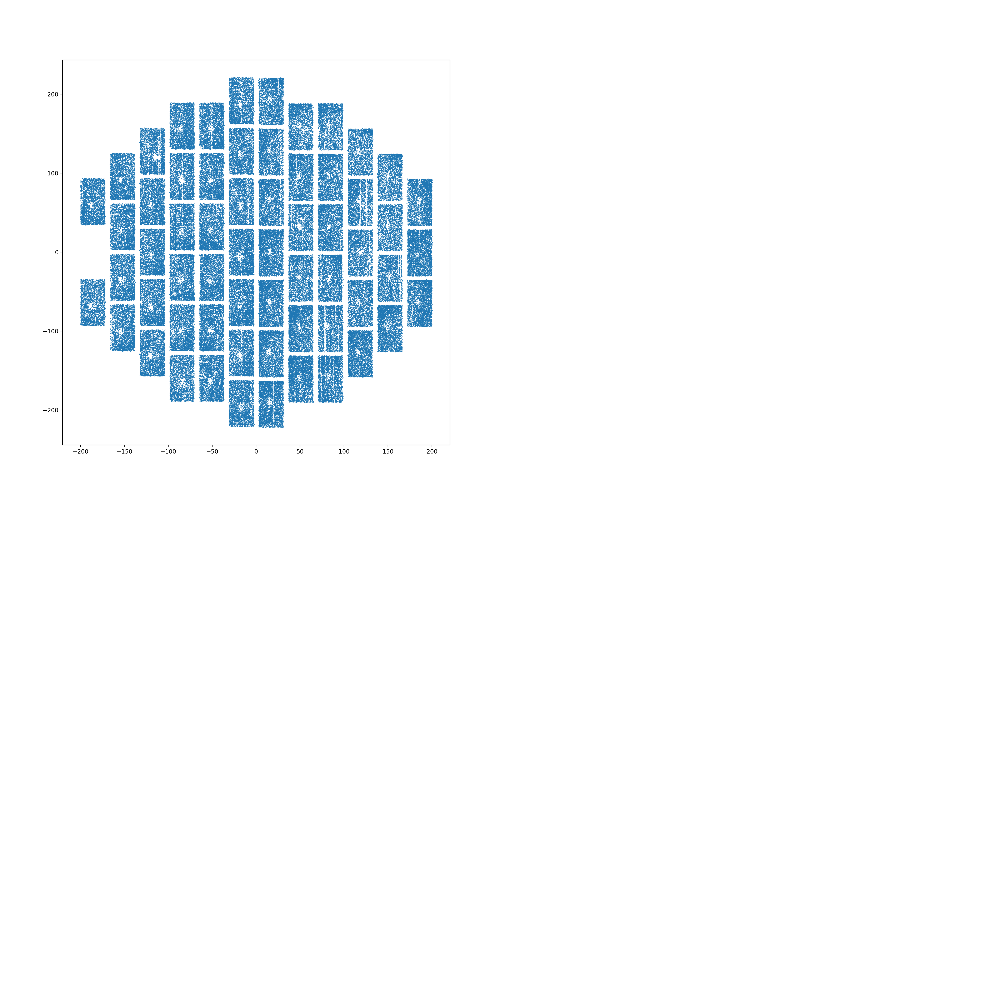

In [31]:
# plot location of unused donuts
f,ax = plt.subplots(1,1,figsize=(12,12))
p = ax.scatter(allFramesPCB['XDECAM'],allFramesPCB['YDECAM'],marker='.',s=1)

<IPython.core.display.Javascript object>


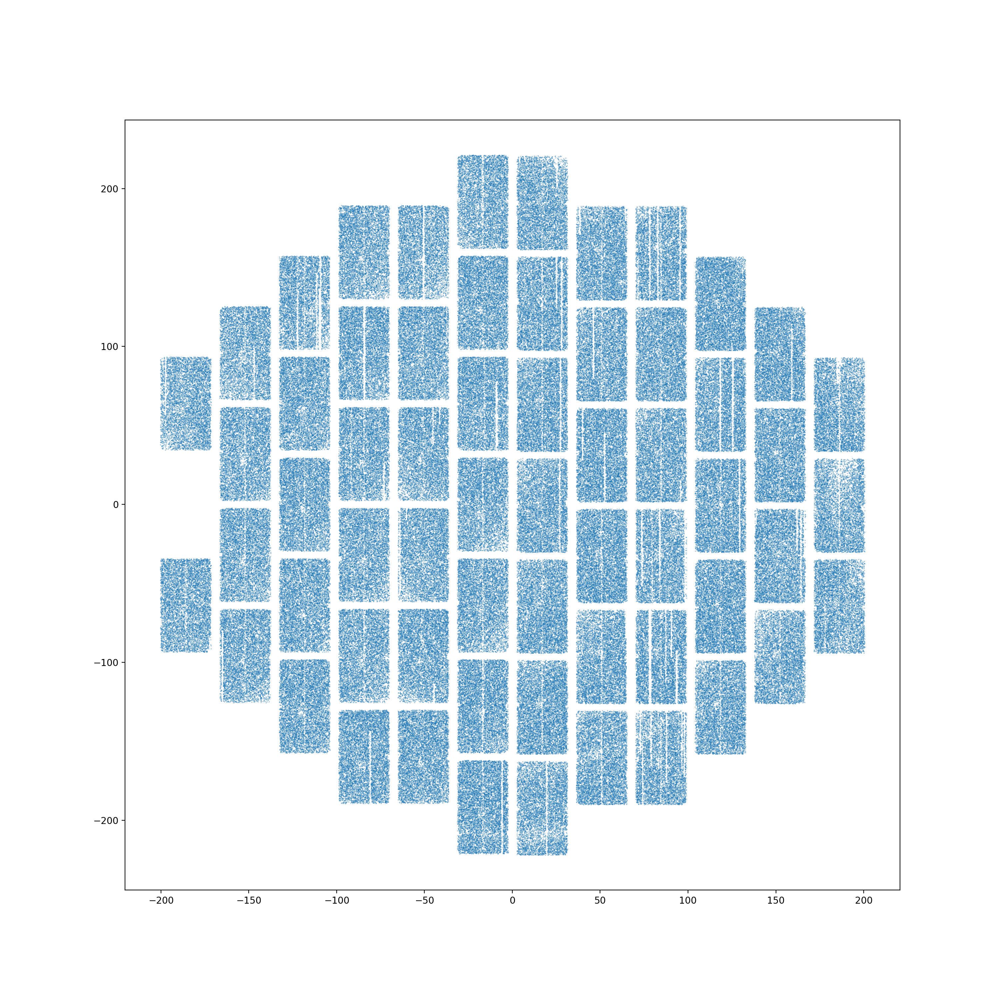

In [38]:
# plot location of used donuts
f,ax = plt.subplots(1,1,figsize=(15,15))
p = ax.scatter(allFramesPC['XDECAM'],allFramesPC['YDECAM'],marker='.',s=.1)